In [ ]:
import cv2
import numpy as np
import scipy.ndimage
from matplotlib import pyplot as plt
from skimage.transform import resize
from scipy import io

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torch.utils.data import Dataset
from sklearn.model_selection import train_test_split


In [ ]:
"""
seed = 42
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
torch.backends.cudnn.deterministic = True
"""

'\nseed = 42\nnp.random.seed(seed)\ntorch.manual_seed(seed)\ntorch.cuda.manual_seed(seed)\ntorch.backends.cudnn.deterministic = True\n'

In [ ]:
path = '/content/drive/MyDrive/DLHW/final/moving_target_dataset.npy'
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
data = np.load(path, allow_pickle=True)

print(data)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



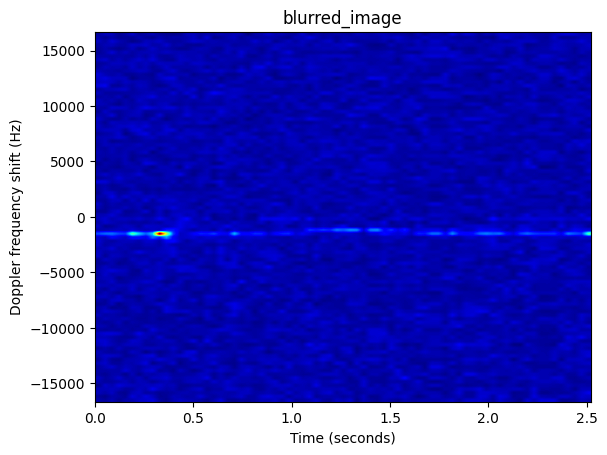

In [ ]:
input_images = []
target_images = []

ksize=3
class_names = ["uav","bicycle","person","vehicle"]
scale_factor = 2


for signature in data:
    for class_name in class_names:
        if (len(signature['snr_db']) > 20 and signature['class_name']==class_name):

            arr1 = signature['signature']
            arr2 = np.abs(arr1).transpose()
            arr2 = cv2.resize(arr2, (1008, 200))

            #arr2 =  20 * np.log10(np.abs(arr1)).transpose()
            interp_times = 1
            res = resize(arr2, (arr2.shape[0]/scale_factor , arr2.shape[1] /scale_factor))
            arr = res
            blurred_image = arr
            #blurred_image = cv2.GaussianBlur(arr, (ksize, ksize), 0)



            #print(signature['ts'][-1]-signature['ts'][0])
            #print("Length in seconds: " + str((signature['ts'][-1]-signature['ts'][0])/100))
            prf = signature['radar_parameters']['prf']
            plt.imshow(arr, cmap='jet', aspect='auto', vmax=np.max(arr), vmin=np.min(arr),
                          extent=[0, arr.shape[1]/200, -int(prf/2), int(prf / 2)])

            plt.title(signature['class_name'])
            plt.autoscale()
            # plt.colorbar(axdata)
            plt.xlabel('Time (seconds)')
            plt.ylabel('Doppler frequency shift (Hz)')
            #plt.show()

            #plt.imshow(blurred_image, cmap='jet', aspect='auto', vmax=np.max(arr), vmin=np.min(arr),
            #              extent=[0, arr.shape[1]/200, -int(prf/2), int(prf / 2)])
            plt.title("blurred_image")
            plt.autoscale()
            #plt.colorbar(axdata)
            plt.xlabel('Time (seconds)')
            plt.ylabel('Doppler frequency shift (Hz)')
            #plt.show()


            #blurred_images.append(blurred_image)
            #original_image.append(arr)
            input_images.append(blurred_image[np.newaxis,:])
            target_images.append(arr2[np.newaxis,:])



In [ ]:
print(len(input_images))
print(input_images[0].shape)
print(len(target_images))
print(target_images[0].shape)

341
(1, 100, 504)
341
(1, 200, 1008)


In [ ]:
class UNet(nn.Module):
    def __init__(self, in_channels, out_channels, num_filters, scale_factor):
        super(UNet, self).__init__()

        self.encoder = nn.Sequential(
            nn.Upsample(scale_factor = scale_factor, mode='bilinear'),
            nn.Conv2d(in_channels, num_filters, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.BatchNorm2d(num_filters),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(num_filters, num_filters, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.BatchNorm2d(num_filters),
            nn.MaxPool2d(kernel_size=2, stride=2)
        )

        self.middle = nn.Sequential(
            nn.Conv2d(num_filters, num_filters, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.BatchNorm2d(num_filters),
            nn.Linear(252, 252),  # 調整線性層的輸入和輸出大小
            nn.ReLU(inplace=True),
            nn.BatchNorm2d(num_filters),
            nn.Conv2d(num_filters, num_filters, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.BatchNorm2d(num_filters)
        )

        self.decoder = nn.Sequential(
            nn.Upsample(scale_factor=2, mode='bilinear', align_corners=False),
            nn.Conv2d(num_filters, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.BatchNorm2d(out_channels),
            nn.Upsample(scale_factor=2, mode='bilinear', align_corners=False),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),

        )

    def forward(self, x):

        x = self.encoder(x)

        for i in range(5):

          x = self.middle(x)

        x = self.decoder(x)
        return x


class MyDataset(Dataset):
    def __init__(self, input_images, target_images):
        self.input_images = input_images
        self.target_images = target_images

    def __getitem__(self, index):
        input_image = self.input_images[index]
        target_image = self.target_images[index]
        max = np.max(target_image)
        min = np.min(target_image) + 10e-3
        # normalization

        input_image = (input_image - min) / (max - min)
        target_image = (target_image - min) / (max - min)

        return input_image, target_image

    def __len__(self):
        return len(self.input_images)

In [ ]:
train_images, test_images, train_targets, test_targets = train_test_split(input_images, target_images, test_size=0.2, random_state=42)

train_dataset = MyDataset(train_images, train_targets)
test_dataset = MyDataset(test_images, test_targets)

train_loader = DataLoader(train_dataset, batch_size=1, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
in_channels = 1
out_channels = 1
num_filters = 32
unet = UNet(in_channels, out_channels, num_filters, scale_factor)
unet = unet.to(device)


loss_fn = nn.L1Loss()
optimizer = optim.Adam(unet.parameters(), lr=3*10e-4)
num_epochs = 200

loss_list=np.zeros((2,num_epochs))

for epoch in range(num_epochs):
    unet.train()
    running_loss = 0.0

    for inputs, targets in train_loader:

        inputs = inputs.to(device)
        targets = targets.to(device)

        outputs = unet(inputs)

        loss = loss_fn(outputs, targets)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    avg_train_loss = running_loss / len(train_loader)

    unet.eval()

    with torch.no_grad():
        test_loss = 0.0

        for inputs, targets in test_loader:

            inputs = inputs.to(device)
            targets = targets.to(device)

            outputs = unet(inputs)
            loss = loss_fn(outputs, targets)

            test_loss += loss.item()

        avg_test_loss = test_loss / len(test_loader)

    print(f"Epoch {epoch+1}/{num_epochs}, Train Loss: {avg_train_loss}, Test Loss: {avg_test_loss}")
    loss_list[0,epoch] = avg_train_loss
    loss_list[1,epoch] = avg_test_loss


Epoch 1/200, Train Loss: 0.025717370155582425, Test Loss: 0.014229591536011709
Epoch 2/200, Train Loss: 0.011394192518149366, Test Loss: 0.012745465330806548
Epoch 3/200, Train Loss: 0.011450205755382366, Test Loss: 0.0125244142136712
Epoch 4/200, Train Loss: 0.011122625980693983, Test Loss: 0.012575223660636424
Epoch 5/200, Train Loss: 0.01120712739023421, Test Loss: 0.013550765761781646
Epoch 6/200, Train Loss: 0.011303589183251675, Test Loss: 0.012651701073121765
Epoch 7/200, Train Loss: 0.011223790177609771, Test Loss: 0.01307926742710929
Epoch 8/200, Train Loss: 0.01128260388984071, Test Loss: 0.01262772371115136
Epoch 9/200, Train Loss: 0.011414065065978588, Test Loss: 0.01307629119010939
Epoch 10/200, Train Loss: 0.011155248942754149, Test Loss: 0.013371530074990638
Epoch 11/200, Train Loss: 0.011182694846545072, Test Loss: 0.01259643376291986
Epoch 12/200, Train Loss: 0.01138419015392976, Test Loss: 0.014714330596768337
Epoch 13/200, Train Loss: 0.011307316877612132, Test Loss:

In [ ]:
print(inputs.shape)
print(targets.shape)
l2loss = nn.MSELoss()

torch.Size([1, 1, 100, 504])
torch.Size([1, 1, 200, 1008])


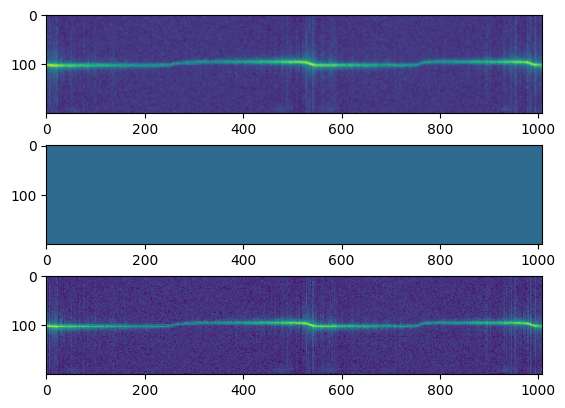

-10.205048 -59.2257
-42.020947 -42.032322
0.0 -168.52785
tensor(0.0001)


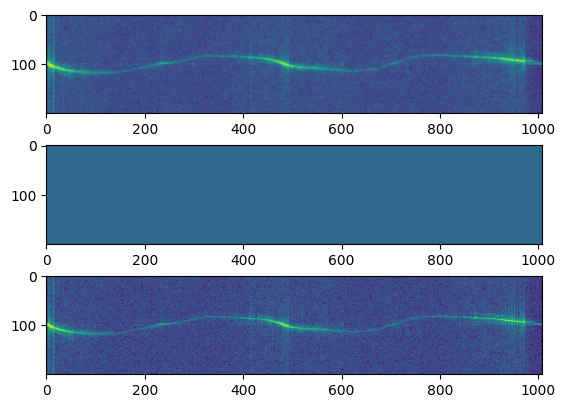

-4.541351 -61.31781
-42.020947 -42.032322
0.0 -162.53304
tensor(0.0002)


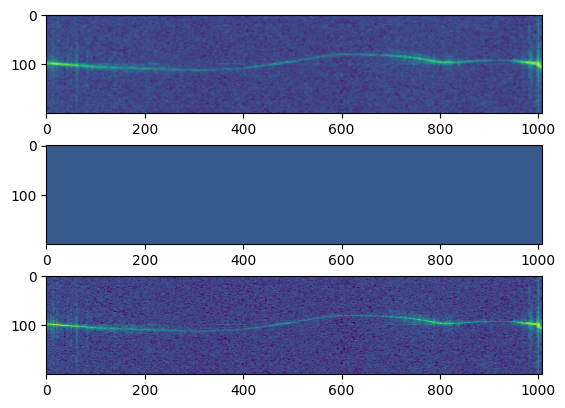

-4.857266 -56.622566
-42.020947 -42.032322
0.0 -160.60919
tensor(0.0002)


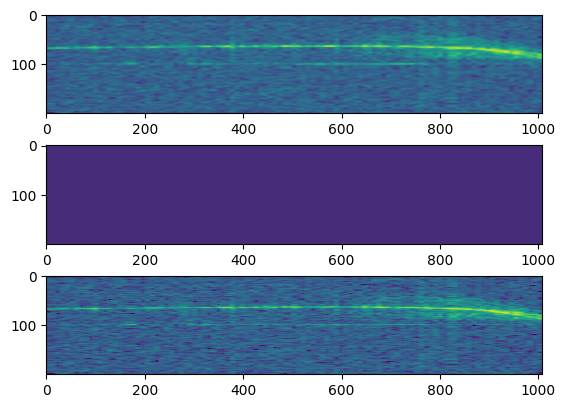

-5.3078203 -47.335396
-42.020947 -42.032322
0.0 -150.96437
tensor(0.0015)


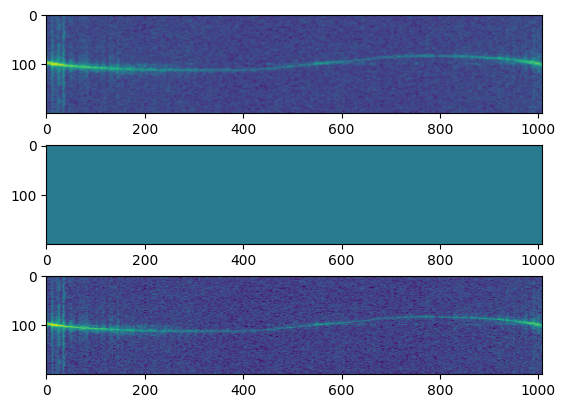

-7.8653407 -65.81453
-42.020947 -42.032322
0.0 -168.32918
tensor(9.2636e-05)


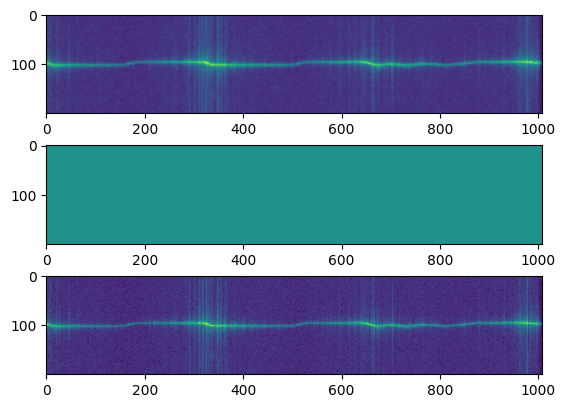

-11.152266 -74.224976
-42.020947 -42.032322
0.0 -182.04079
tensor(7.1587e-05)


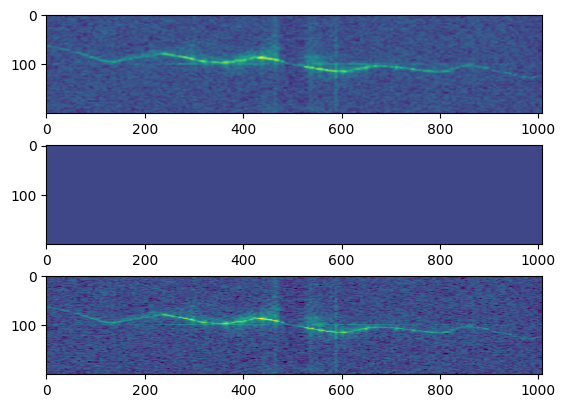

-5.0440187 -52.127766
-42.020947 -42.032322
0.0 -157.52985
tensor(0.0004)


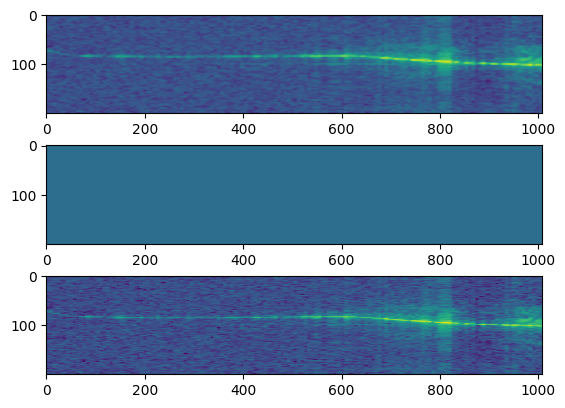

-6.866456 -61.969513
-42.020947 -42.032322
0.0 -165.2051
tensor(0.0004)


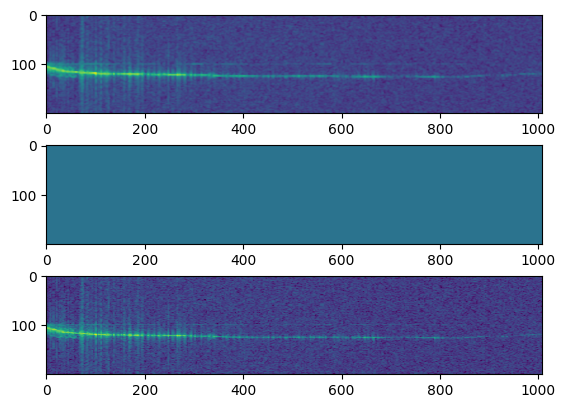

-6.7303886 -63.702003
-42.020947 -42.032322
0.0 -169.48015
tensor(0.0002)


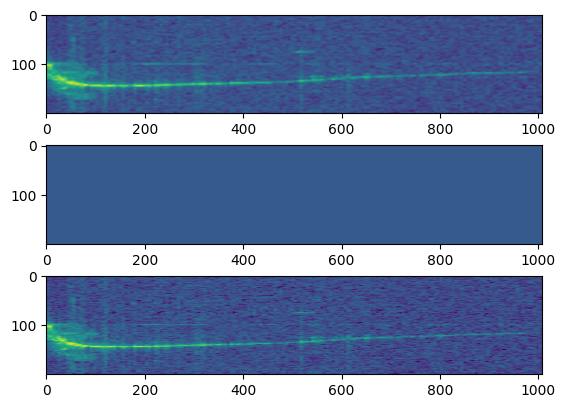

-5.322952 -56.54545
-42.020947 -42.032322
0.0 -160.41858
tensor(0.0004)


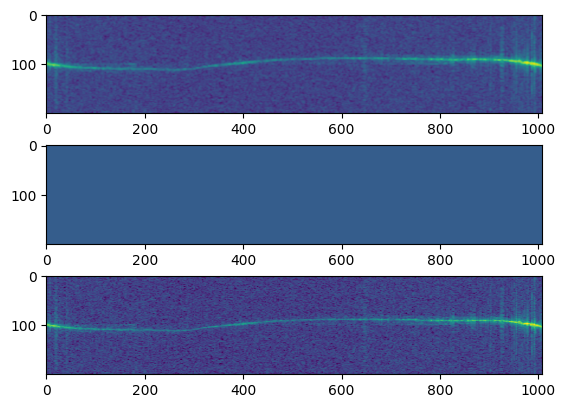

-4.2085257 -57.807926
-42.020947 -42.032322
0.0 -162.00212
tensor(0.0002)


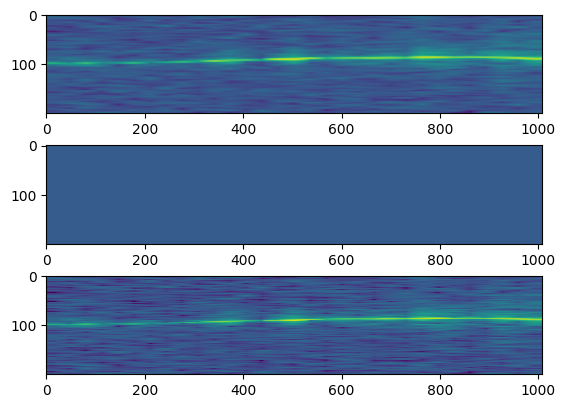

-6.6898346 -56.451702
-42.020947 -42.032322
0.0 -163.03581
tensor(0.0008)


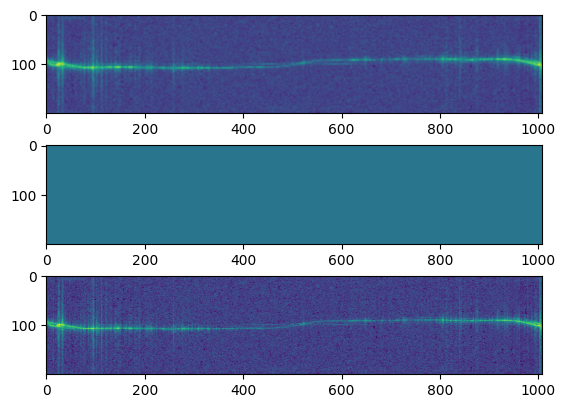

-8.303488 -63.33793
-42.020947 -42.032322
0.0 -169.09247
tensor(9.5089e-05)


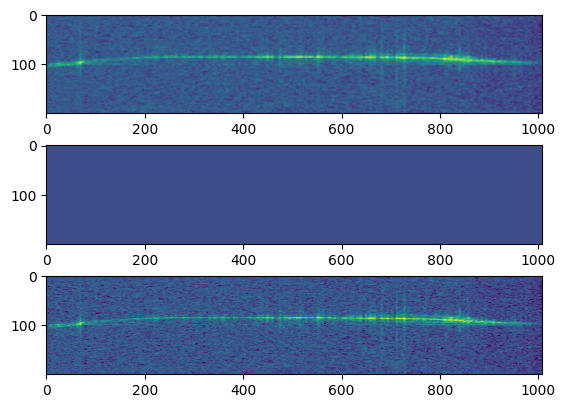

-6.249345 -53.1866
-42.020947 -42.032322
0.0 -156.82784
tensor(0.0005)


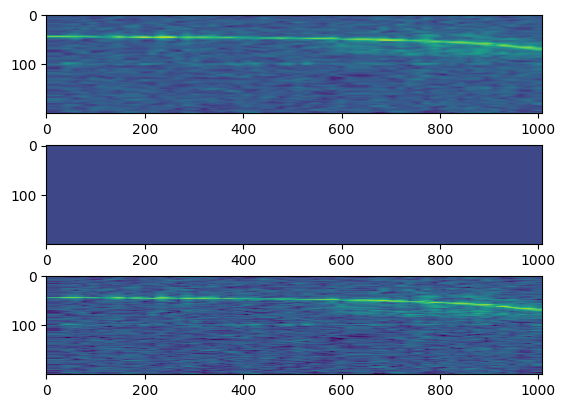

-6.6646156 -51.92125
-42.020947 -42.032322
0.0 -153.59087
tensor(0.0007)


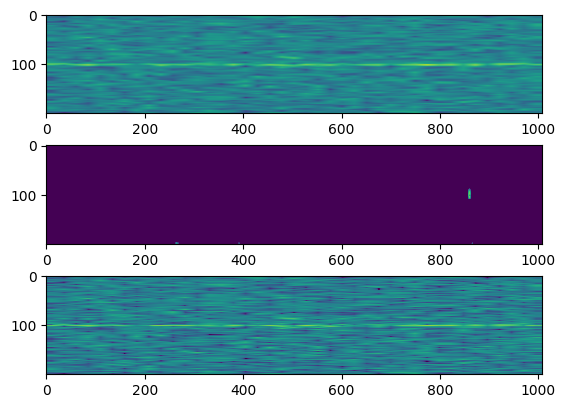

-5.668735 -35.154984
-4.4093466 -68.278595
0.0 -136.49219
tensor(0.0076)


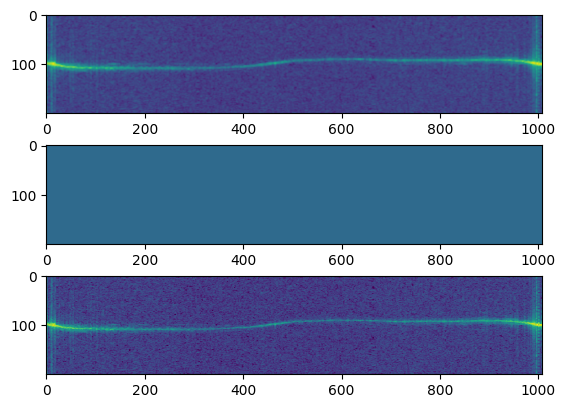

-4.54174 -61.897102
-42.020947 -42.032322
0.0 -165.9112
tensor(0.0002)


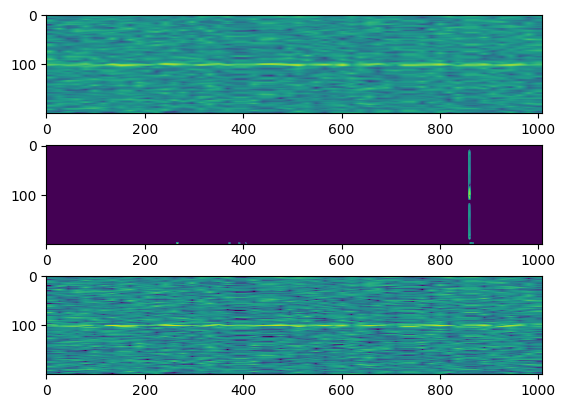

-5.4278417 -33.896477
-1.4891952 -61.992348
0.0 -133.9102
tensor(0.0138)


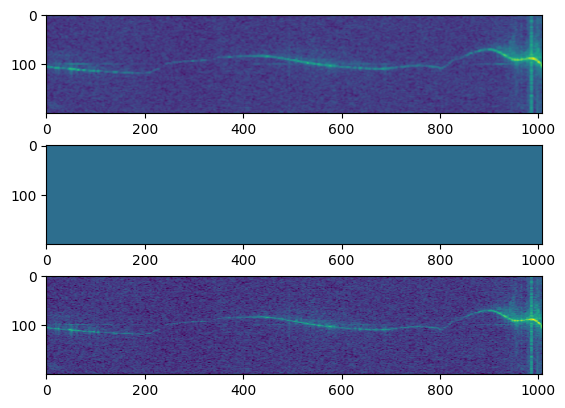

-5.439063 -62.890125
-42.020947 -42.032322
0.0 -169.98553
tensor(0.0001)


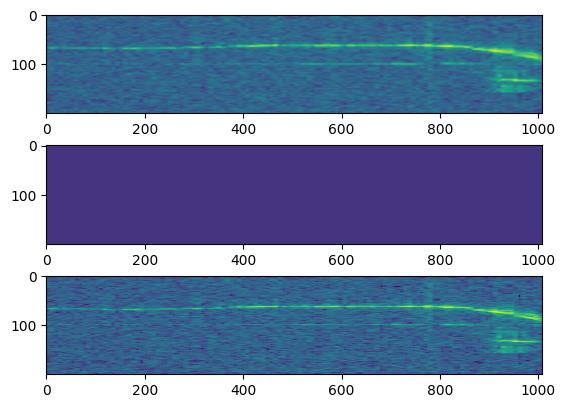

-3.4014406 -49.14625
-42.020947 -42.032322
0.0 -151.06004
tensor(0.0015)


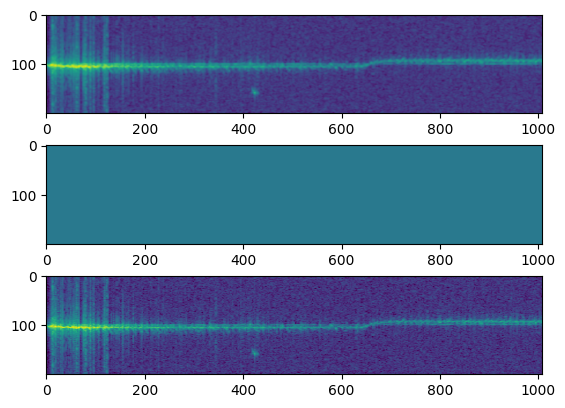

-5.7586713 -66.69124
-42.020947 -42.032322
0.0 -176.22241
tensor(0.0003)


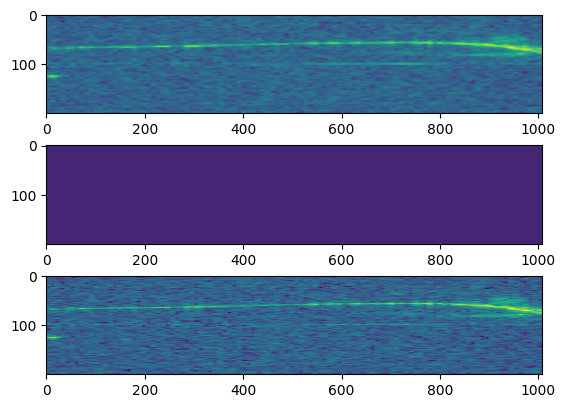

-3.2416153 -46.59385
-42.020947 -42.032322
0.0 -149.12125
tensor(0.0017)


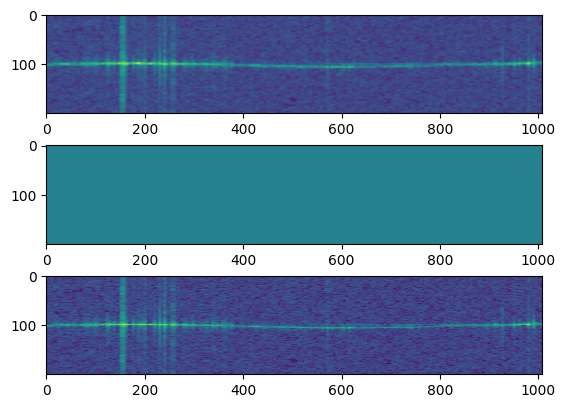

-7.5466466 -69.02492
-42.020947 -42.032322
0.0 -172.28365
tensor(9.6113e-05)


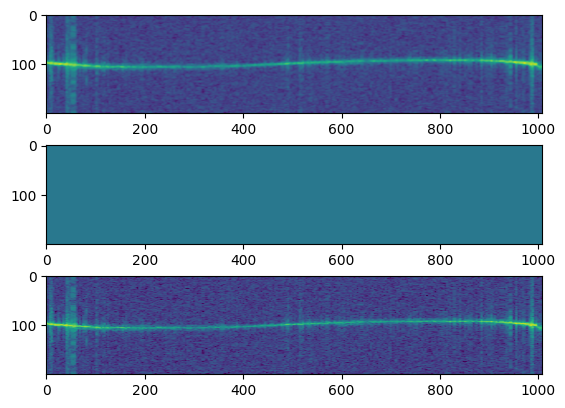

-7.194131 -65.30633
-42.020947 -42.032322
0.0 -168.67952
tensor(0.0002)


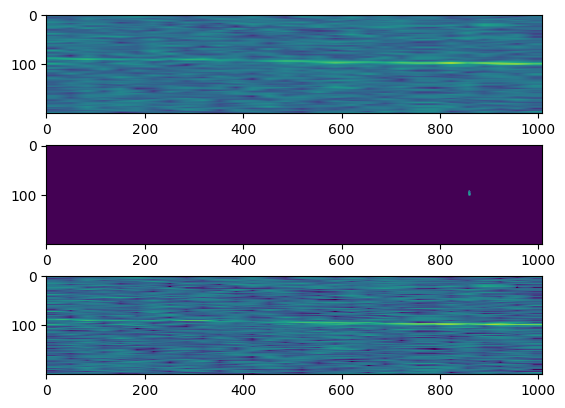

-5.1260624 -35.81231
-10.658201 -86.736435
0.0 -139.34993
tensor(0.0043)


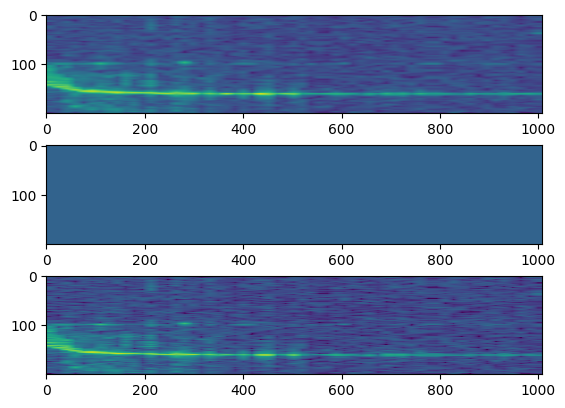

-6.132781 -58.762318
-42.020947 -42.032322
0.0 -161.07794
tensor(0.0005)


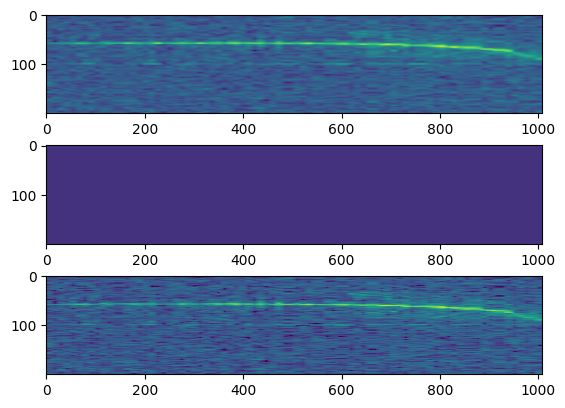

-6.37038 -48.089394
-42.020947 -42.032322
0.0 -150.51016
tensor(0.0009)


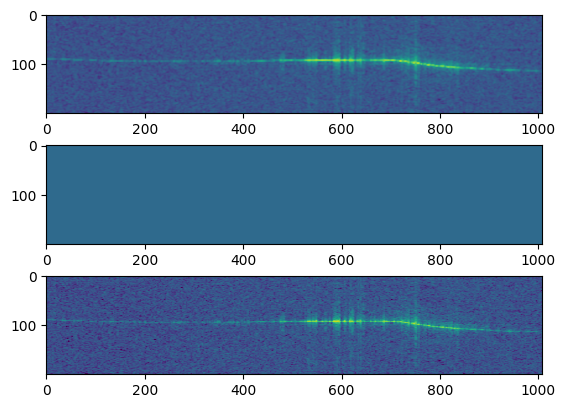

-8.19326 -59.931374
-42.020947 -42.032322
0.0 -163.35715
tensor(0.0002)


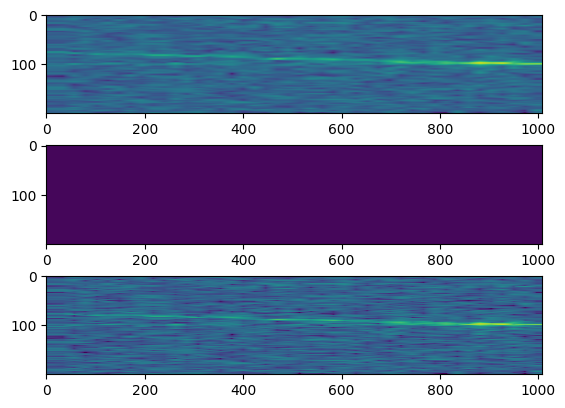

-2.9118683 -42.711864
-42.020947 -42.032322
0.0 -144.302
tensor(0.0018)


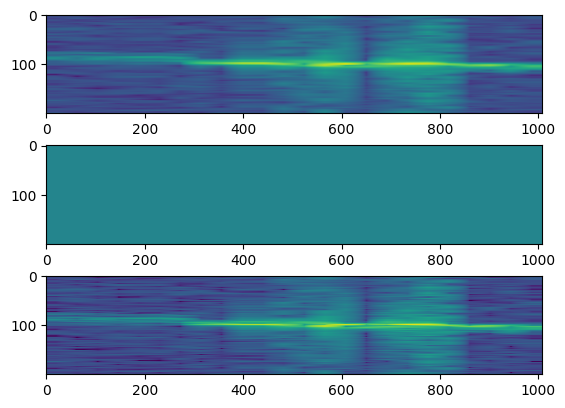

-6.314283 -71.78432
-42.020947 -42.032322
0.0 -173.03429
tensor(0.0006)


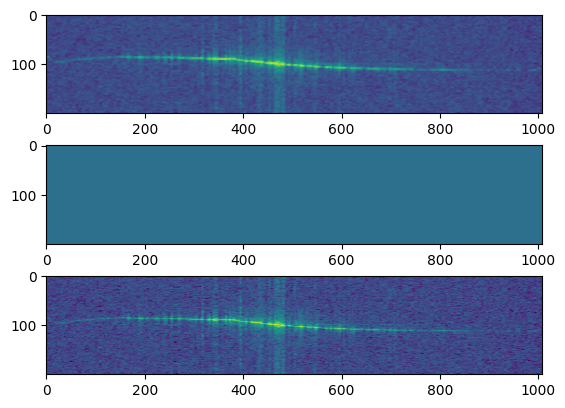

-6.41994 -63.006268
-42.020947 -42.032322
0.0 -167.247
tensor(0.0002)


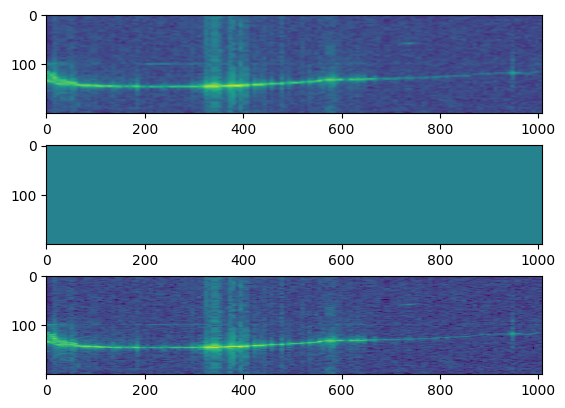

-6.922904 -70.14255
-42.020947 -42.032322
0.0 -172.4162
tensor(0.0002)


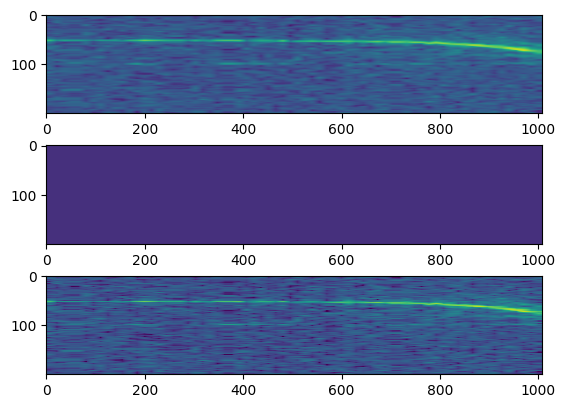

-4.382629 -48.11079
-42.020947 -42.032322
0.0 -150.93579
tensor(0.0008)


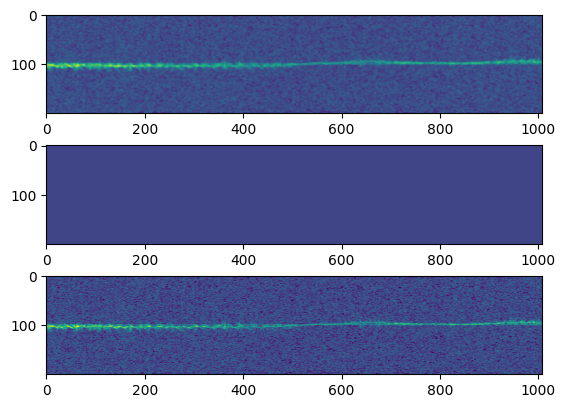

-6.0359216 -51.579327
-42.020947 -42.032322
0.0 -149.42899
tensor(0.0003)


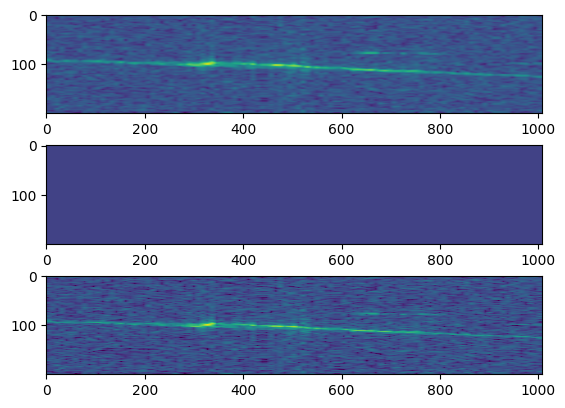

-4.686057 -51.12287
-42.020947 -42.032322
0.0 -155.3087
tensor(0.0004)


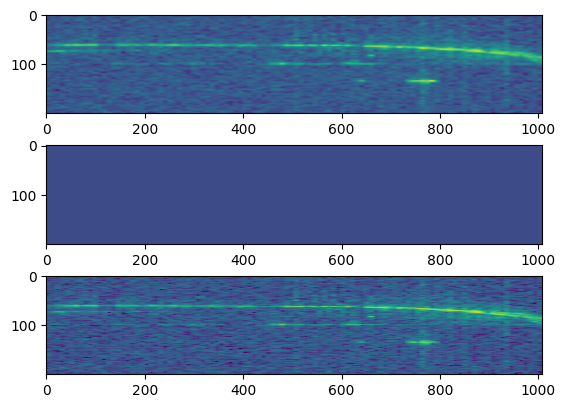

-6.9973445 -52.41407
-42.020947 -42.032322
0.0 -156.42255
tensor(0.0005)


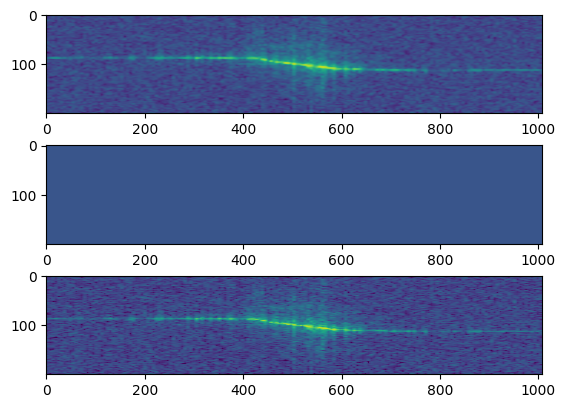

-5.919161 -54.848003
-42.020947 -42.032322
0.0 -164.12239
tensor(0.0003)


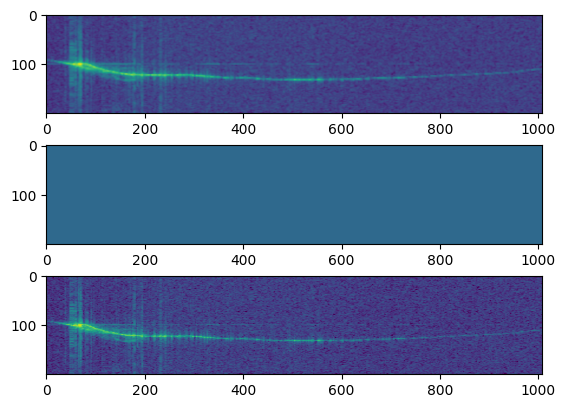

-3.2807155 -62.115593
-42.020947 -42.032322
0.0 -167.31401
tensor(0.0002)


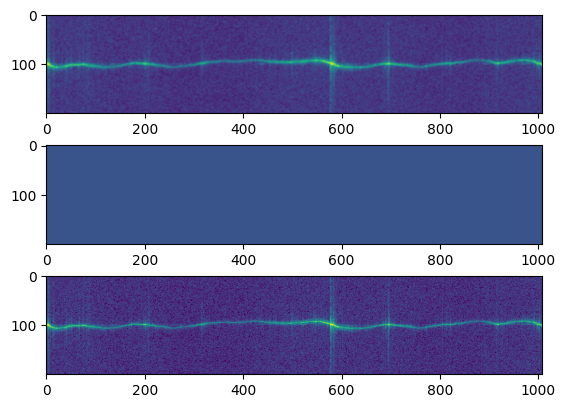

-4.43431 -55.143745
-42.020947 -42.032322
0.0 -161.9371
tensor(0.0002)


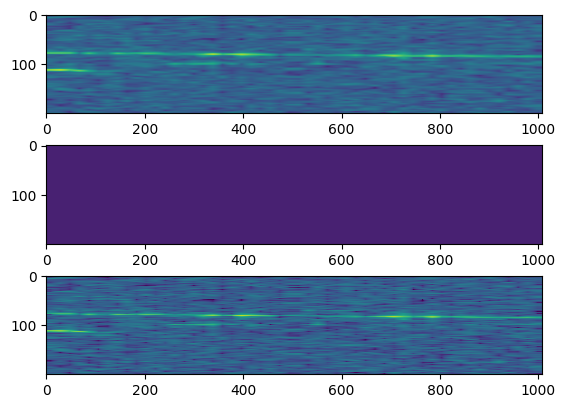

-4.6291122 -45.885025
-42.020947 -42.032322
0.0 -149.1893
tensor(0.0011)


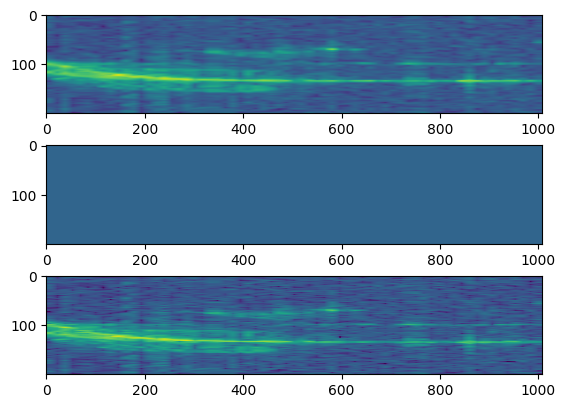

-5.2485332 -59.768368
-42.020947 -42.032322
0.0 -161.72453
tensor(0.0008)


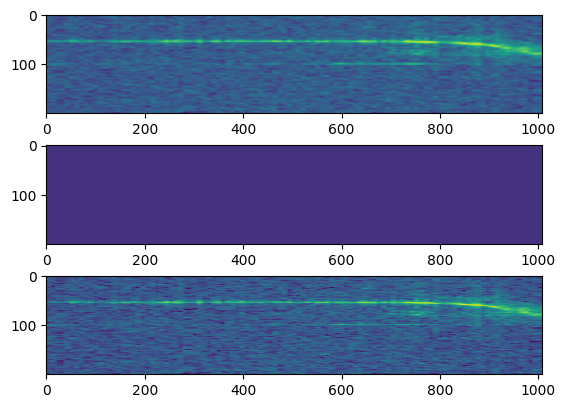

-5.5024343 -48.32889
-42.020947 -42.032322
0.0 -152.77658
tensor(0.0010)


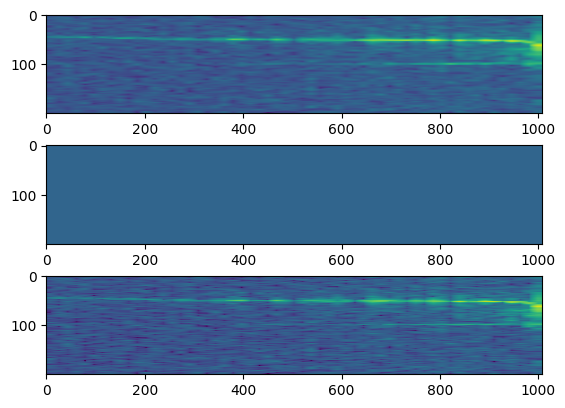

-6.4020767 -59.29562
-42.020947 -42.032322
0.0 -163.02827
tensor(0.0005)


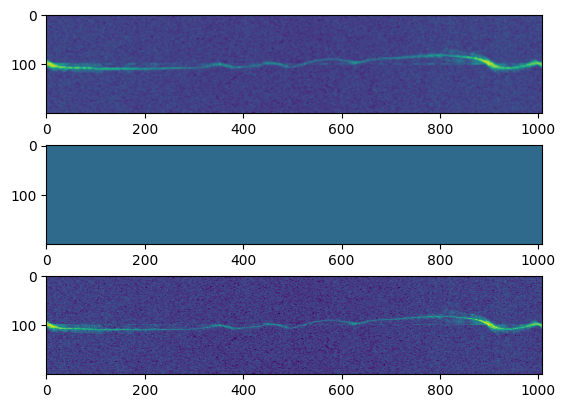

-5.72154 -61.12824
-42.020947 -42.032322
0.0 -158.57697
tensor(0.0002)


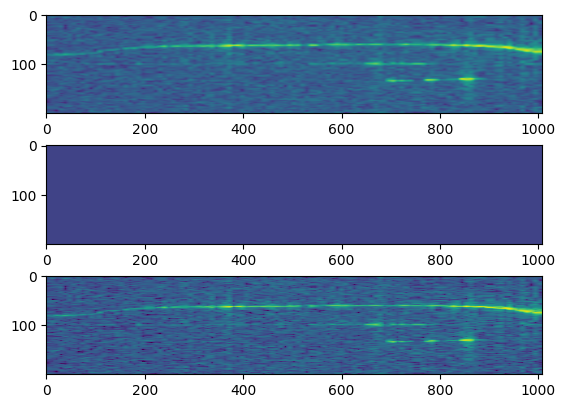

-6.178068 -51.116756
-42.020947 -42.032322
0.0 -154.27533
tensor(0.0008)


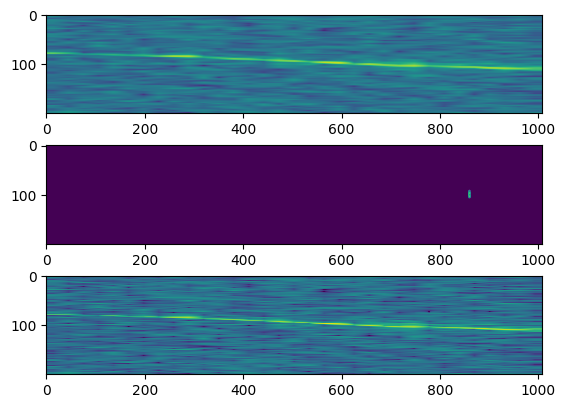

-5.4441957 -39.91928
-8.708147 -61.085247
0.0 -143.94986
tensor(0.0035)


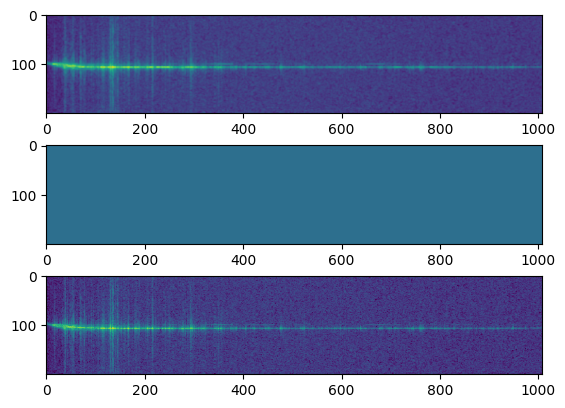

-6.5932126 -62.331825
-42.020947 -42.032322
0.0 -169.01645
tensor(0.0002)


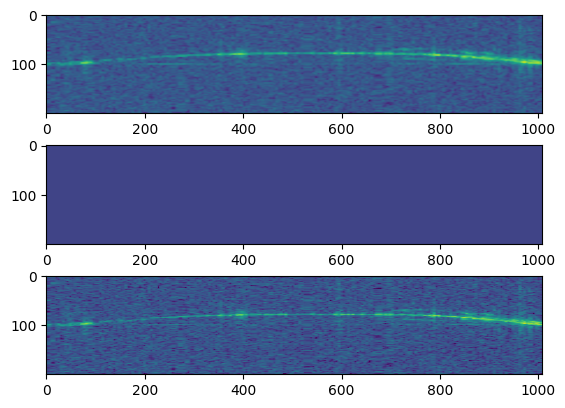

-4.0926356 -51.709755
-42.020947 -42.032322
0.0 -155.91006
tensor(0.0005)


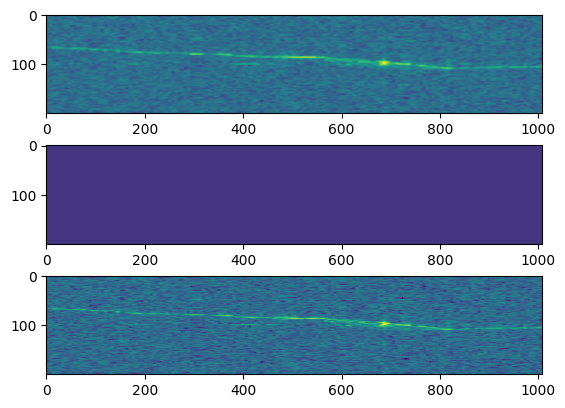

-5.168625 -48.524742
-42.020947 -42.032322
0.0 -149.05026
tensor(0.0008)


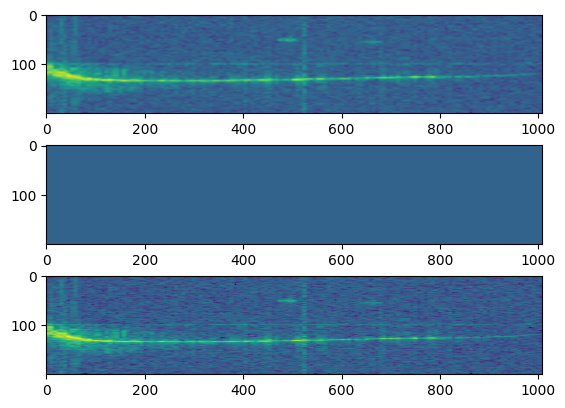

-3.5636802 -59.974976
-42.020947 -42.032322
0.0 -159.95442
tensor(0.0009)


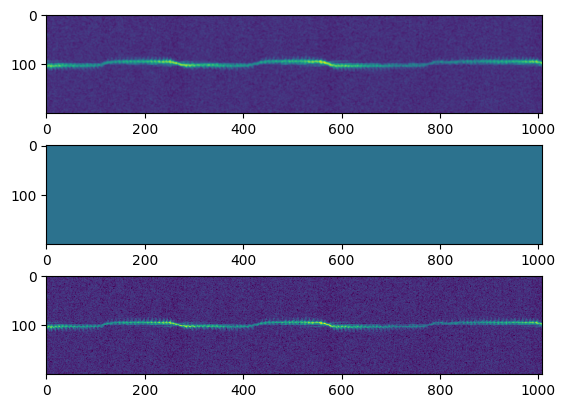

-9.146966 -62.08178
-42.020947 -42.032322
0.0 -163.35931
tensor(0.0001)


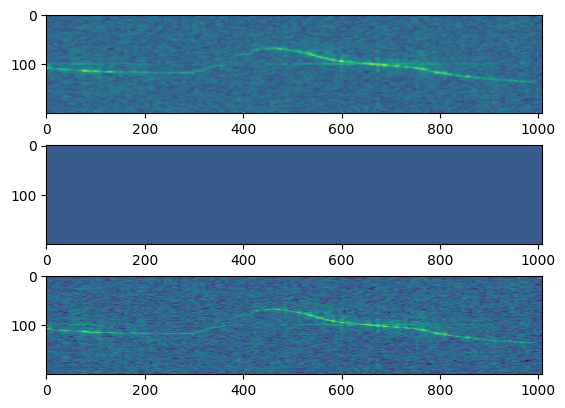

-7.09919 -56.173256
-42.020947 -42.032322
0.0 -156.23601
tensor(0.0002)


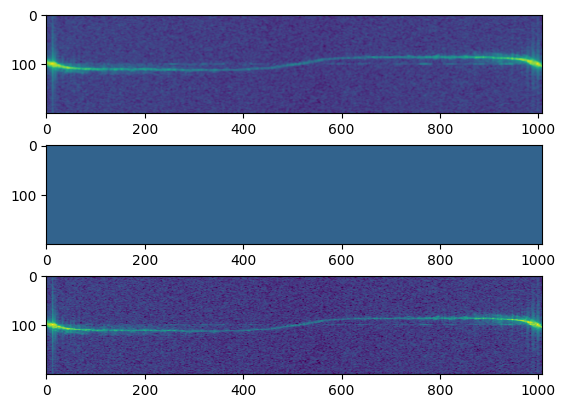

-4.029732 -59.863987
-42.020947 -42.032322
0.0 -158.45508
tensor(0.0003)


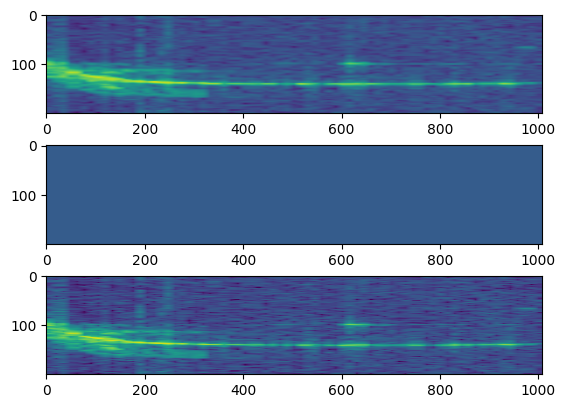

-5.383759 -57.140366
-42.020947 -42.032322
0.0 -162.07019
tensor(0.0010)


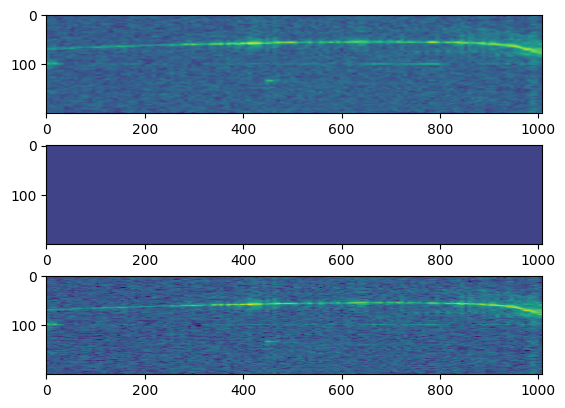

-3.962391 -51.576355
-42.020947 -42.032322
0.0 -153.39485
tensor(0.0009)


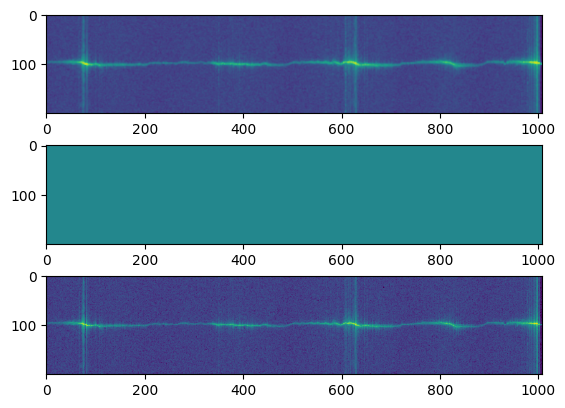

-8.665858 -70.967415
-42.020947 -42.032322
0.0 -175.45547
tensor(0.0001)


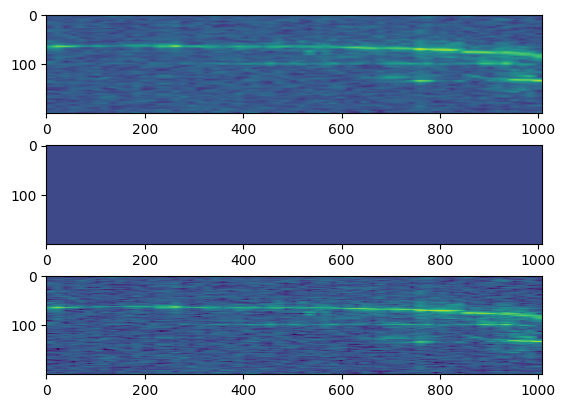

-4.531152 -52.562157
-42.020947 -42.032322
0.0 -155.74754
tensor(0.0007)


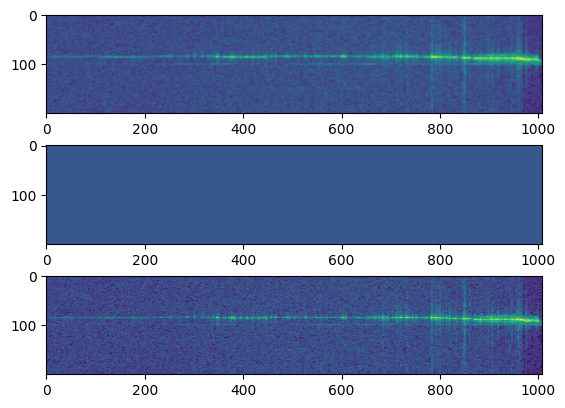

-5.5390797 -56.001926
-42.020947 -42.032322
0.0 -160.31262
tensor(0.0004)


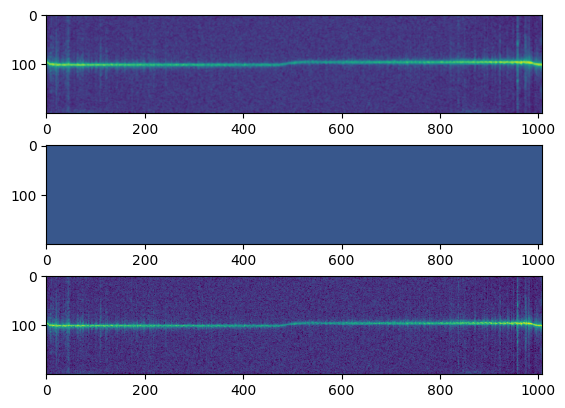

-6.5118027 -55.27755
-42.020947 -42.032322
0.0 -164.2139
tensor(0.0003)


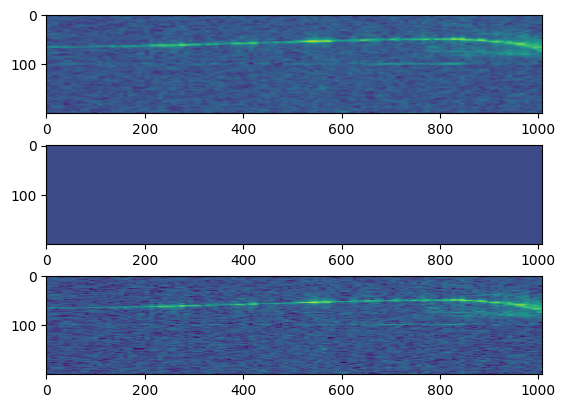

-5.867154 -52.76606
-42.020947 -42.032322
0.0 -156.78084
tensor(0.0004)


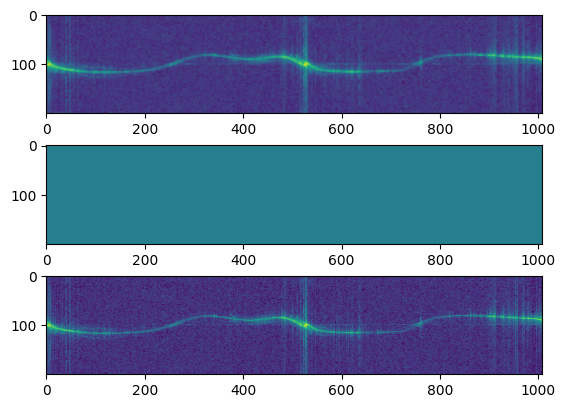

-8.833981 -67.26699
-42.020947 -42.032322
0.0 -175.066
tensor(9.0240e-05)


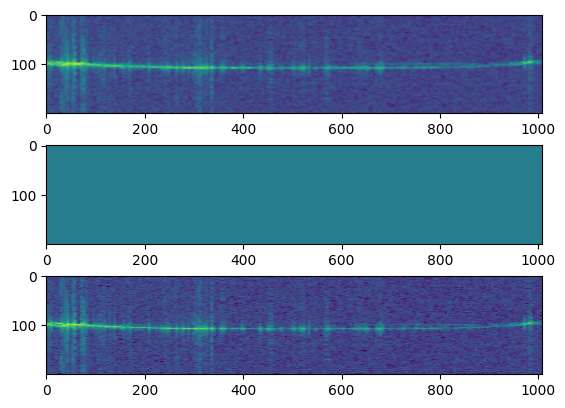

-6.347926 -68.6155
-42.020947 -42.032322
0.0 -172.22644
tensor(0.0002)


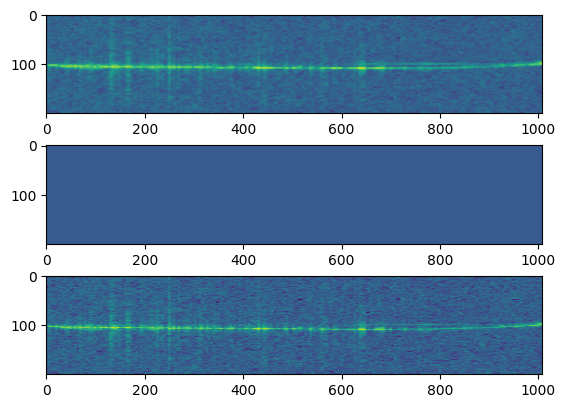

-6.33054 -56.289387
-42.020947 -42.032322
0.0 -157.48898
tensor(0.0006)


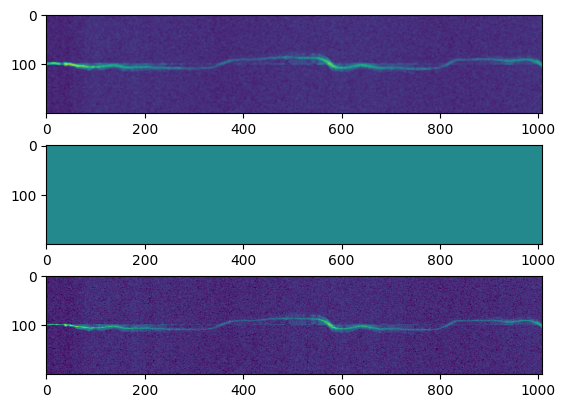

-9.891496 -70.723114
-42.020947 -42.032322
0.0 -171.26556
tensor(8.7818e-05)


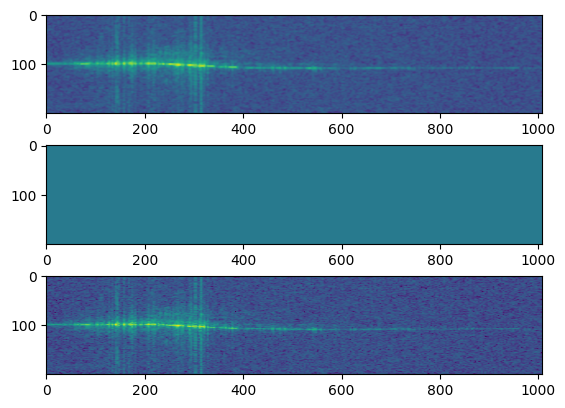

-7.1403885 -66.11261
-42.020947 -42.032322
0.0 -168.26637
tensor(0.0002)


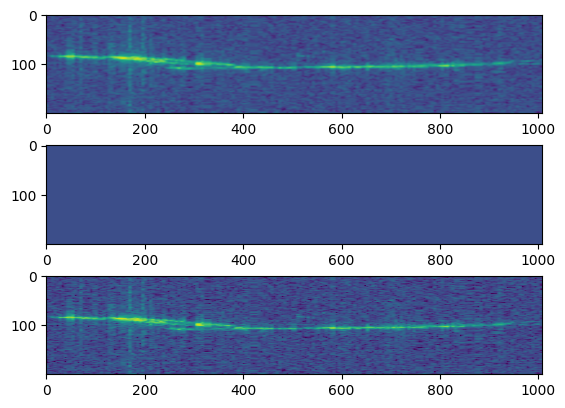

-4.067939 -53.962822
-42.020947 -42.032322
0.0 -158.32321
tensor(0.0006)


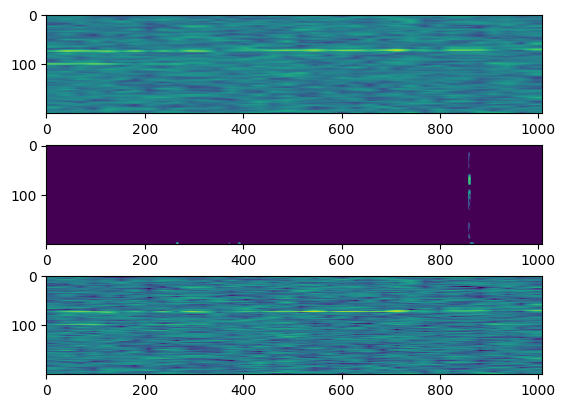

-4.050986 -33.377613
-2.9904256 -76.14263
0.0 -137.16792
tensor(0.0110)


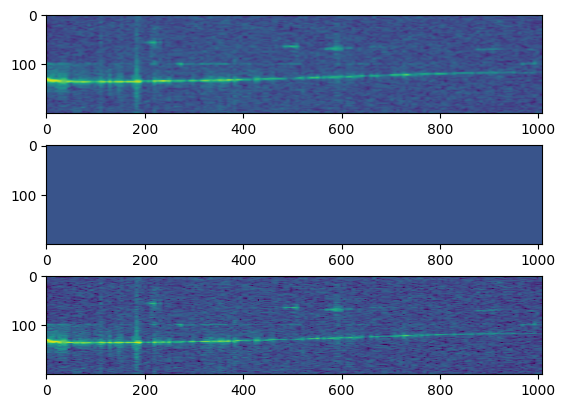

-4.821878 -54.97718
-42.020947 -42.032322
0.0 -159.41156
tensor(0.0005)


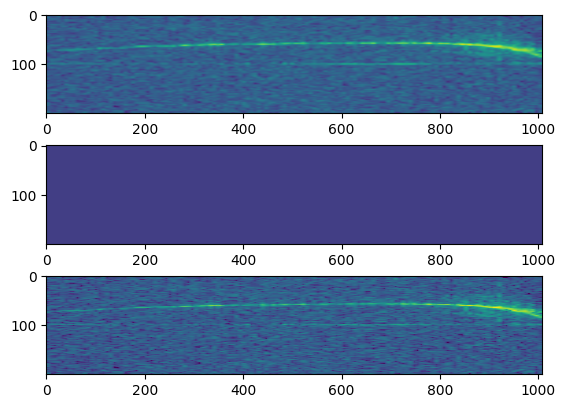

-5.676604 -50.34047
-42.020947 -42.032322
0.0 -153.63097
tensor(0.0007)


In [ ]:
up = nn.Upsample(scale_factor = scale_factor, mode='bilinear')

with torch.no_grad():
        test_loss = 0.0
        i = 0
        for inputs, targets in test_loader:
            #if i == 19:
            inputs = inputs.to(device)
            targets = targets.to(device)

            outputs = unet(inputs)
            data_max = np.max(20*np.log10(np.abs(inputs.cpu().detach().numpy()[0,0])))
            data_min = np.min(20*np.log10(np.abs(inputs.cpu().detach().numpy()[0,0])))

            plt.subplot(3,1,1)
            plt.imshow(20*np.log10(np.abs(up(inputs).cpu().detach().numpy()[0,0])), vmax = data_max, vmin = data_min)
            plt.subplot(3,1,2)
            plt.imshow(20*np.log10(np.abs(outputs.cpu().detach().numpy()[0,0])), vmax = data_max, vmin = data_min)
            plt.subplot(3,1,3)
            plt.imshow(20*np.log10(np.abs(targets.cpu().detach().numpy()[0,0])), vmax = data_max, vmin = data_min)
            plt.show()
            print(np.max(20*np.log10(np.abs(inputs.cpu().detach().numpy()[0,0]))),np.min(20*np.log10(np.abs(inputs.cpu().detach().numpy()[0,0]))))
            print(np.max(20*np.log10(np.abs(outputs.cpu().detach().numpy()[0,0]))),np.min(20*np.log10(np.abs(outputs.cpu().detach().numpy()[0,0]))))
            print(np.max(20*np.log10(np.abs(targets.cpu().detach().numpy()[0,0]))),np.min(20*np.log10(np.abs(targets.cpu().detach().numpy()[0,0]))))
            print(l2loss(np.abs(outputs.cpu()),np.abs(targets.cpu())))
            """
            elif i > 19:
                break
            i += 1
            """

In [ ]:
np.abs(outputs.cpu())

tensor([[[[0.0059, 0.0058, 0.0058,  ..., 0.0058, 0.0058, 0.0058],
          [0.0059, 0.0058, 0.0058,  ..., 0.0058, 0.0058, 0.0057],
          [0.0059, 0.0058, 0.0058,  ..., 0.0058, 0.0058, 0.0057],
          ...,
          [0.0059, 0.0058, 0.0058,  ..., 0.0058, 0.0058, 0.0057],
          [0.0059, 0.0058, 0.0058,  ..., 0.0058, 0.0058, 0.0057],
          [0.0059, 0.0058, 0.0058,  ..., 0.0058, 0.0058, 0.0058]]]])

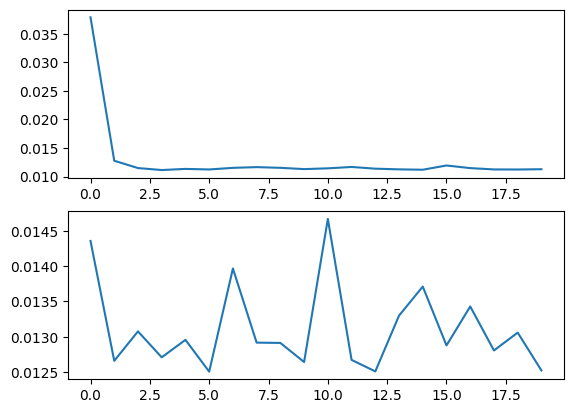

In [ ]:
plt.subplot(2,1,1)
plt.plot(loss_list[0])
plt.subplot(2,1,2)
plt.plot(loss_list[1])